<a href="https://colab.research.google.com/github/rafatb/Berlin_Airbnb_Price_Prediction/blob/main/1_Berlin_Airbnb_Price_Prediction_data_preperation_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Airbnb Berlin price prediction - phase 1 , Data preperation**

**Connect to google drive**


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

!pip install geopy
!pip install autoviz
!pip install missingno
!pip install nltk
!pip install pyodbc

# **Data Preperation**
##Read Berline Airbnb Dataset
This file contain all the data of Berline Airbnb liatings from 2009 - 2019


In [3]:
import numpy as np
import os
import pandas as pd

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import ensemble, tree, linear_model
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from scipy.stats import pearsonr
import pyodbc
import seaborn as sns
sns.set()
plt.style.use('ggplot')
import re
from scipy import stats
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import ks_2samp
from scipy.stats import norm
import missingno as msno
import warnings
import datetime
warnings.filterwarnings("ignore")
import nltk
#nltk.download('popular')
nltk.download('punkt')
nltk.download('wordnet')
# Ignore warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', 500)

df = pd.read_csv('/content/drive/MyDrive/kaggle/berline/Airbnb Berlin.csv')
pd.set_option('display.max_columns', None)
df['review_date'] = pd.to_datetime(df['review_date'])

df.shape

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


(456961, 47)

#Clean the data (the obvious from first glanse)
In this section we going to drop all the.
* redundant / duplicate data.
* drop all the column that contains same value , these data is not useful.
* drop all the data the clearly will not help me during this jurney , like (Urls , reviewer  id , reviewer name ... )

In [4]:
df = df.drop(columns=['Review ID', 'Reviewer ID', 'Reviewer Name', 'Listing URL','Listing Name','Host ID', 'Host URL', 'Host Name',
                           'City', 'Country Code', 'Country','First Review', 'Last Review', 'Business Travel Ready',
            ])

In [6]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 456961 entries, 0 to 456960
Data columns (total 33 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   index                 456961 non-null  int64         
 1   review_date           452805 non-null  datetime64[ns]
 2   Comments              452595 non-null  object        
 3   Listing ID            456961 non-null  int64         
 4   Host Since            456913 non-null  object        
 5   Host Response Time    398194 non-null  object        
 6   Host Response Rate    398194 non-null  object        
 7   Is Superhost          456913 non-null  object        
 8   neighbourhood         456961 non-null  object        
 9   Neighborhood Group    456961 non-null  object        
 10  Postal Code           449258 non-null  object        
 11  Latitude              456961 non-null  float64       
 12  Longitude             456961 non-null  float64       
 13 

#Fix and Punctuations clean

* remove from numbers the following extra chars , like $ , %  
* from catigories remove chars that not numbers  
* fix some of the Postal Code values that contains non relevant data



In [7]:
# remove the $ from price
df['Price'] = df['Price'].replace('[\$,]', '', regex=True).astype(float)

# remove the % from 'Host Response Rate'
df['Host Response Rate'] = df['Host Response Rate'].replace('[\%,]', '', regex=True).astype(float)

# Fix Postal Code incorrect values, remove '\n'and other irrelevant text
df['Postal Code'] = df['Postal Code'].astype(str).str[:5]

In [8]:
df.shape

(456961, 33)

# Aggregate alls the reviews of Listing to one raw GroupBy 'Listing Id':

In this Data set we have multiple reviews for each Listing , we going to aggregare all the reviews grouped by 'Listing Id'.
Columns aggreagted on 3 deferent ways:
1. mean
3. last value
4. String Concatination

In [9]:
# Define columns by type
mean_columns = ["Overall Rating","Accuracy Rating", "Cleanliness Rating", "Checkin Rating",
    "Communication Rating", "Location Rating", "Value Rating","Price","Square Feet","Reviews"
    ]
string_concat_values_columns = ["Comments"]
choose_last_value_columns = ["review_date","Bedrooms","Beds","Bathrooms","Host Response Rate","Is Superhost","Latitude","Longitude",
                         "Accomodates", "Guests Included","Min Nights","Instant Bookable",
                         "Accomodates", "Host Since","Is Exact Location","Postal Code", "Latitude", "Longitude",
                         "Property Type","Host Response Time", "Neighborhood Group","neighbourhood", "Room Type"
                         ]
# Aggregation functions
aggregation_functions = {
    **{col: "mean" for col in mean_columns},  # Mean for ratings
    **{col: 'last' for col in choose_last_value_columns},  # Concat unique values
    **{col: lambda x: ", ".join(x.dropna().unique()) for col in string_concat_values_columns}  # Concat unique values
}
# Group by 'Listing ID' and apply aggregation
df_aggregated = df.groupby("Listing ID").agg(aggregation_functions).reset_index()
df_aggregated.head(2)

,Listing ID,Overall Rating,Accuracy Rating,Cleanliness Rating,Checkin Rating,Communication Rating,Location Rating,Value Rating,Price,Square Feet,Reviews,review_date,Bedrooms,Beds,Bathrooms,Host Response Rate,Is Superhost,Latitude,Longitude,Accomodates,Guests Included,Min Nights,Instant Bookable,Host Since,Is Exact Location,Postal Code,Property Type,Host Response Time,Neighborhood Group,neighbourhood,Room Type,Comments
0,2695,100.0,10.0,10.0,10.0,10.0,9.0,10.0,17.0,NaN,7.0,2019-04-21,1.0,1.0,1.0,50.0,f,52.54851,13.40455,2,1,2,f,09-16-08,t,10437,Apartment,within a day,Pankow,Prenzlauer Berg,Private room,I really enjoyed staying at Micha and Nadja's ...
1,3176,92.0,9.0,9.0,9.0,9.0,10.0,9.0,90.0,720.0,144.0,2018-10-29,1.0,2.0,1.0,50.0,f,52.53500,13.41758,4,2,62,f,10-19-08,t,10405,Apartment,within a day,Pankow,Prenzlauer Berg,Entire home/apt,"excellent stay, i would highly recommend it. a..."


In [15]:
df_aggregated.shape

(23536, 31)

#Move out non relevant data for EDA to deferent datafram.
moving out Comments to different df for later use ,
it's not necessary data for the EDA and subsequent actions down the road.

In [11]:
df_wiht_comments = df_aggregated[['Listing ID', 'Comments']].copy()
df_wiht_comments.to_csv('/content/drive/MyDrive/kaggle/berline/non_relevant_for_EDA.csv')
df_aggregated.drop(columns=['Comments'], inplace=True)

In [13]:
df_aggregated.describe().T

,count,mean,min,25%,50%,75%,max,std
Listing ID,23536.0,17782636.649218,2695.0,9056046.25,18748175.0,25879867.0,34682315.0,9887994.973029
Overall Rating,18914.0,94.564344,20.0,92.0,97.0,100.0,100.0,7.599949
Accuracy Rating,18888.0,9.67985,2.0,10.0,10.0,10.0,10.0,0.737798
Cleanliness Rating,18892.0,9.334904,2.0,9.0,10.0,10.0,10.0,1.031248
Checkin Rating,18870.0,9.728829,2.0,10.0,10.0,10.0,10.0,0.695275
Communication Rating,18886.0,9.746479,2.0,10.0,10.0,10.0,10.0,0.6796
Location Rating,18871.0,9.550315,2.0,9.0,10.0,10.0,10.0,0.748713
Value Rating,18868.0,9.417638,2.0,9.0,10.0,10.0,10.0,0.840456
Price,23536.0,69.612424,0.0,32.0,49.0,75.0,9000.0,216.660408
Square Feet,425.0,487.131765,0.0,0.0,420.0,753.0,4639.0,517.652098


**From the Describe above we can see the following :**

**Price:** there Zero values and big values like 9000 for a night , these values should be remove during the outliers section

**Reviews:** there are Listings with allmost 300k review , this is not real number that can bias the prediction , so we need to remove it

**Bedrooms:** there are Zero bedrooms , we need to fix

**Beds:** there are Zero bedrooms , we need to fix

**Min Nights:** 1000 min nights is not real number , need a fix

**Rating Values:** The rating features almost all of there values 10.


In [17]:
df_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23536 entries, 0 to 23535
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Listing ID            23536 non-null  int64         
 1   Overall Rating        18914 non-null  float64       
 2   Accuracy Rating       18888 non-null  float64       
 3   Cleanliness Rating    18892 non-null  float64       
 4   Checkin Rating        18870 non-null  float64       
 5   Communication Rating  18886 non-null  float64       
 6   Location Rating       18871 non-null  float64       
 7   Value Rating          18868 non-null  float64       
 8   Price                 23536 non-null  float64       
 9   Square Feet           425 non-null    float64       
 10  Reviews               23536 non-null  float64       
 11  review_date           19380 non-null  datetime64[ns]
 12  Bedrooms              23516 non-null  float64       
 13  Beds            

In [ ]:
%matplotlib inline
!pip install autoviz

# Autoviz the data

running Autovis that will generate detailed report regarding the data set

Shape of your Data Set loaded: (23536, 31)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
  Printing up to 30 columns (max) in each category:
    Numeric Columns : ['Overall Rating', 'Reviews', 'Beds', 'Bathrooms', 'Host Response Rate', 'Latitude', 'Longitude', 'Accuracy Rating', 'Cleanliness Rating', 'Checkin Rating', 'Communication Rating', 'Location Rating', 'Value Rating', 'Bedrooms']
    Integer-Categorical Columns: ['Accomodates', 'Guests Included', 'Min Nights']
    String-Categorical Columns: ['Property Type', 'Host Response Time', 'Neighborhood Group', 'Room Type', 'neighbourhood']
    Factor-Categorical Columns: []
    String-Boolean Columns: ['Is Superhost', 'Instant Bookable', 'Is Exact Location']
    Numeric-Boolean Columns

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Overall Rating,float64,19.638001,NA,20.000000,100.000000,"4622 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 465 outliers greater than upper bound (112.00) or lower than lower bound(80.00). Cap them or remove them."
Accuracy Rating,float64,19.748470,NA,2.000000,10.000000,"4648 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 4367 outliers greater than upper bound (10.00) or lower than lower bound(10.00). Cap them or remove them."
Cleanliness Rating,float64,19.731475,NA,2.000000,10.000000,"4644 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 941 outliers greater than upper bound (11.50) or lower than lower bound(7.50). Cap them or remove them."
Checkin Rating,float64,19.824949,NA,2.000000,10.000000,"4666 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 3700 outliers greater than upper bound (10.00) or lower than lower bound(10.00). Cap them or remove them."
Communication Rating,float64,19.756968,NA,2.000000,10.000000,"4650 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 3423 outliers greater than upper bound (10.00) or lower than lower bound(10.00). Cap them or remove them."
Location Rating,float64,19.820700,NA,2.000000,10.000000,"4665 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 303 outliers greater than upper bound (11.50) or lower than lower bound(7.50). Cap them or remove them."
Value Rating,float64,19.833447,NA,2.000000,10.000000,"4668 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 427 outliers greater than upper bound (11.50) or lower than lower bound(7.50). Cap them or remove them."
Reviews,float64,0.000000,NA,0.000000,545.000000,Column has 2983 outliers greater than upper bound (41.00) or lower than lower bound(-23.00). Cap them or remove them.
review_date,datetime64[ns],17.658056,6,,,"Possible date-time colum: transform before modeling step., 4156 missing values. Impute them with mean, median, mode, or a constant value such as 123., Mixed dtypes: has 2 different data types:"
Bedrooms,float64,0.084976,NA,0.000000,10.000000,"20 missing values. Impute them with mean, median, mode, or a constant value such as 123., Column has 5810 outliers greater than upper bound (1.00) or lower than lower bound(1.00). Cap them or remove them."


Number of All Scatter Plots = 105
Could not draw some Time Series plots. agg function failed [how->mean,dtype->object]


[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

Could not draw wordcloud plot for Host Since. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for Postal Code. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots are saved in ./AutoViz_Plots/Price
Time to run AutoViz = 59 seconds 


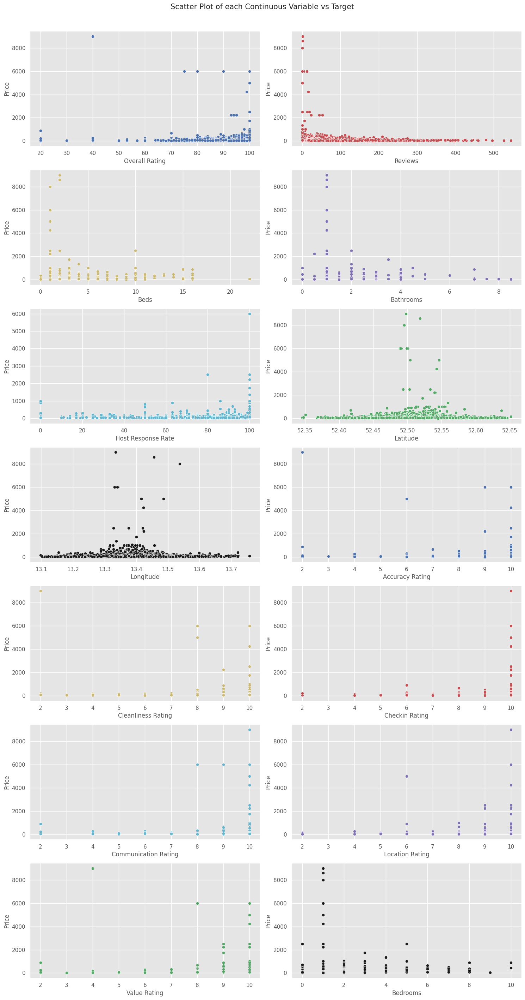

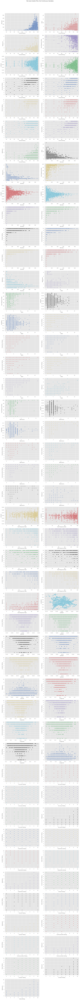

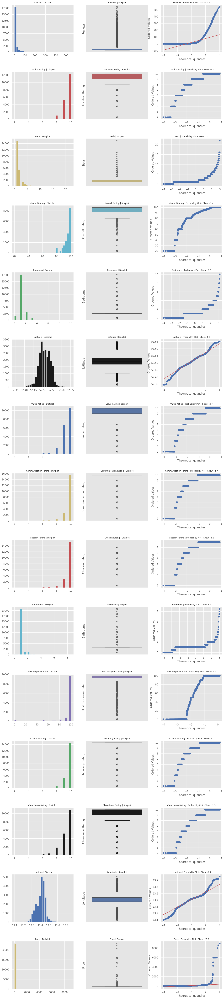

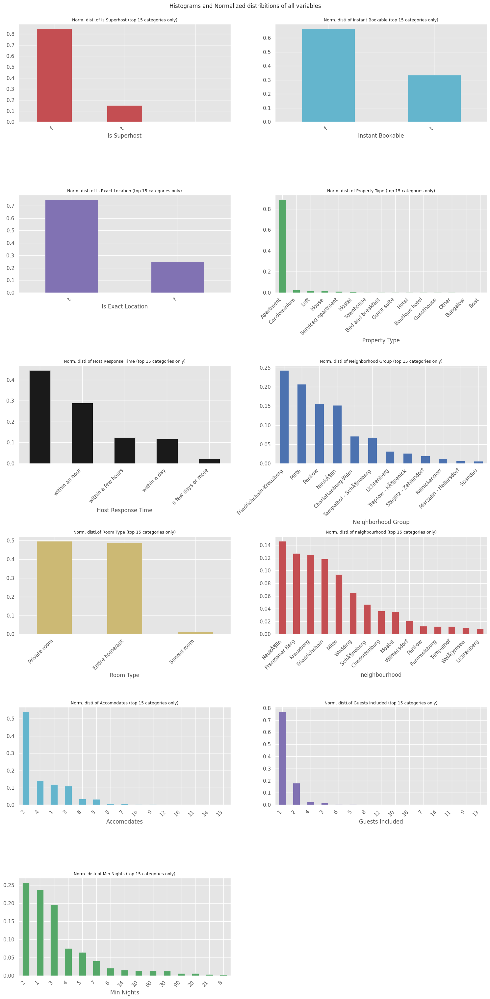

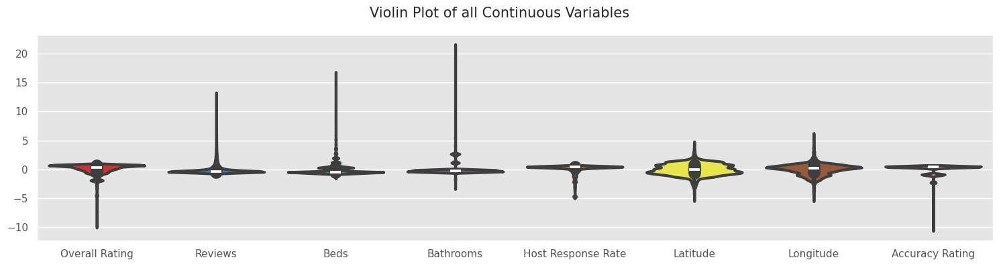

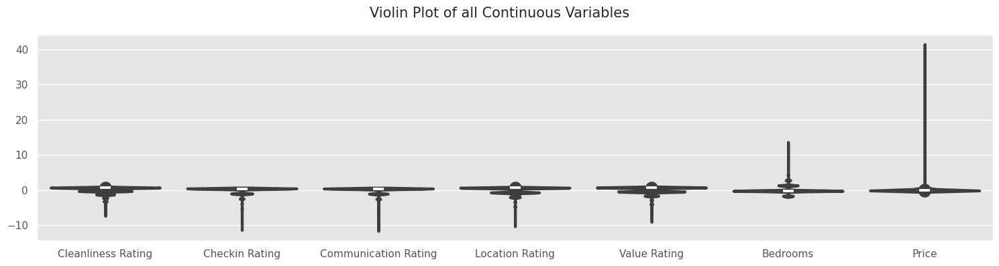

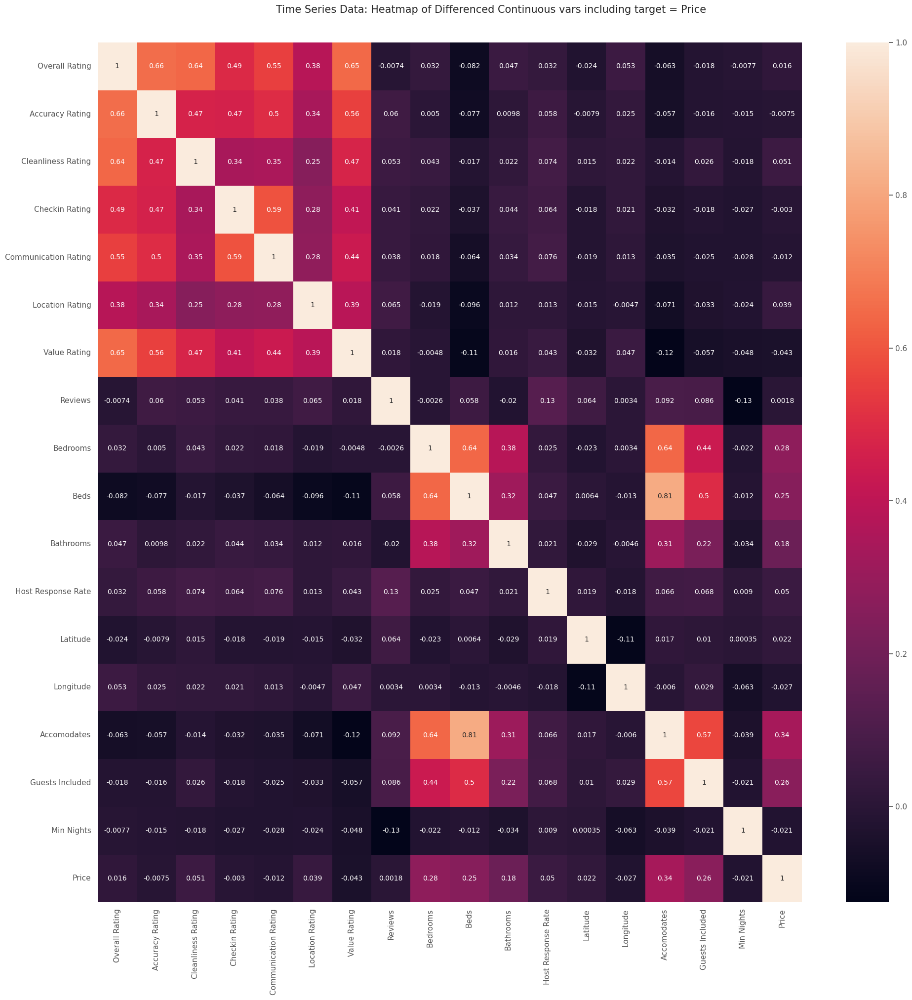

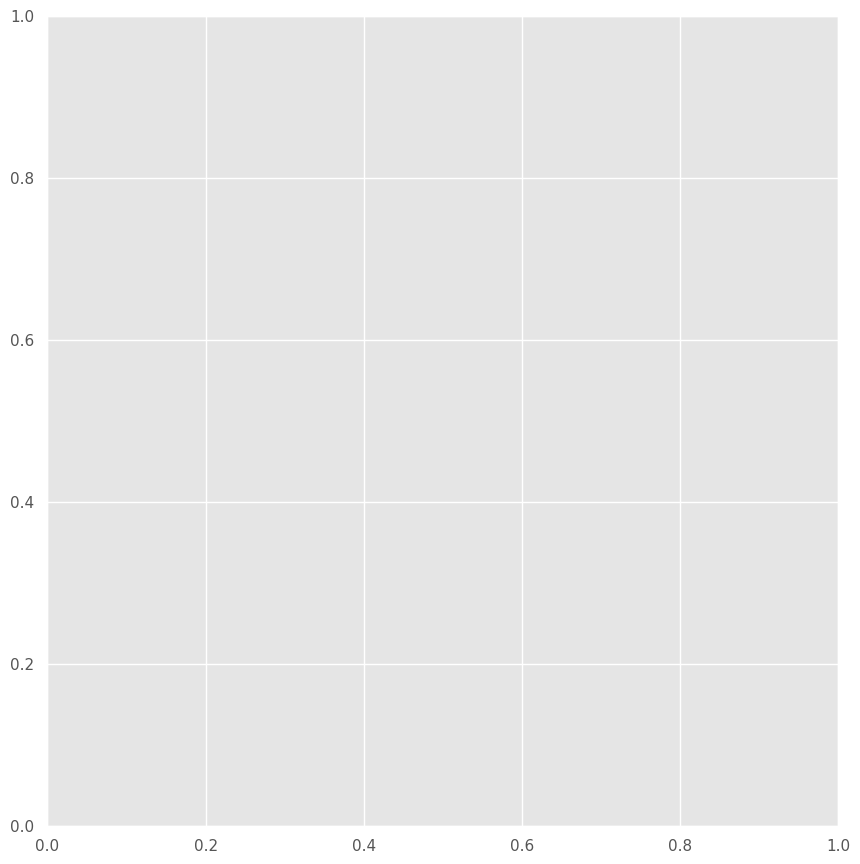

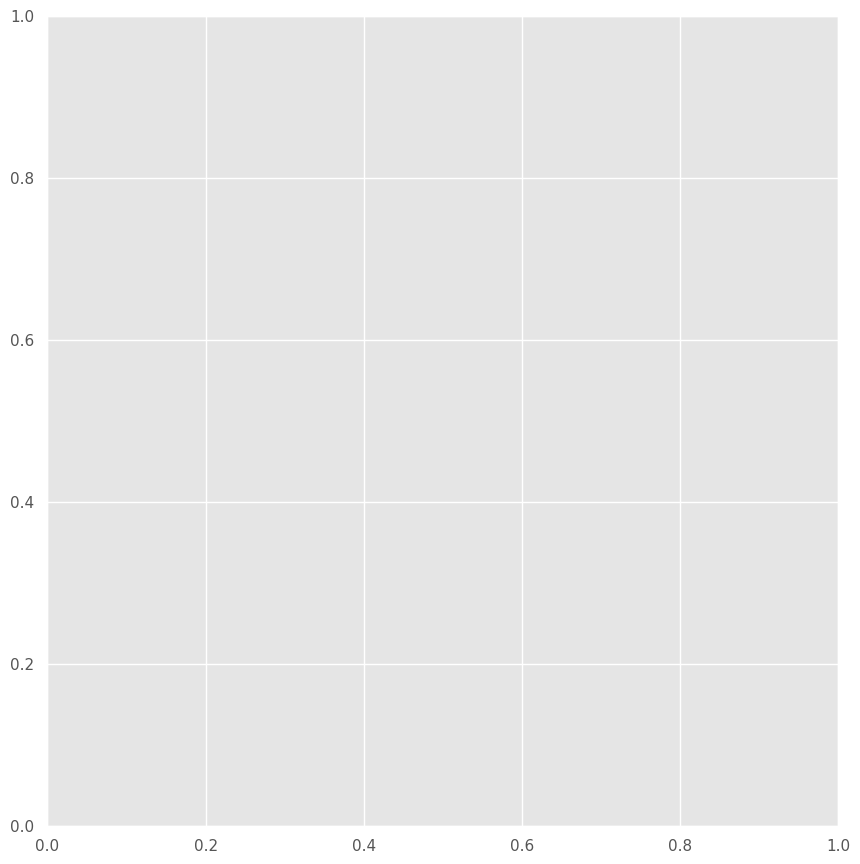

In [ ]:
from autoviz import AutoViz_Class
AV = AutoViz_Class()

filename = ""
target_variable = "Price"

dft = AV.AutoViz(
    filename,
    sep=",",
    depVar=target_variable,
    dfte=df_aggregated,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="png",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
    save_plot_dir=None
)

##Main insights from Autovis report

Columns:
**Numeric Columns :** ['Overall Rating', 'Reviews', 'Beds', 'Bathrooms', 'Host Response Rate', 'Latitude', 'Longitude', 'Accuracy Rating', 'Cleanliness Rating', 'Checkin Rating', 'Communication Rating', 'Location Rating', 'Value Rating', 'Bedrooms']

**Integer-Categorical Columns:** ['Accomodates', 'Guests Included', 'Min Nights']

**String-Categorical Columns:** ['Property Type', 'Host Response Time', 'Neighborhood Group', 'Room Type', 'neighbourhood']

**String-Boolean Columns:** ['Is Superhost', 'Instant Bookable', 'Is Exact Location']

**Discrete String Columns:** ['Postal Code'] - not relevant

**NLP text Columns:** ['Host Since']

**Date Time Columns:** ['review_date']

**ID Columns:** ['Listing ID']

Columns that will not be considered in modeling: ['Square Feet']

##Main Missing Data insights:
the following columns **missing ~45% values**  :
Host Response Rate,Host Response Time

the following columns **missing ~19% values**  :
Overall Rating,Accuracy Rating, Cleanliness Rating,Checkin Rating,Communication Rating, Location Rating , Value Rating , review_date

the following columns **missing ~0.01% values**  :
Bedrooms,Beds,Bathrooms,Is Superhost,Host Since




# Data uniquness

In [18]:
df_aggregated.nunique().sort_values(ascending=False)

,0
Listing ID,23536
Longitude,13260
Latitude,10032
Host Since,3085
review_date,1464
Reviews,332
Price,326
Postal Code,207
Square Feet,109
Min Nights,97


#Missing data

In [19]:
missing_values = df_aggregated.isna().sum()
missing_values = missing_values[missing_values > 0]
# Display results
print(missing_values)

Overall Rating           4622
Accuracy Rating          4648
Cleanliness Rating       4644
Checkin Rating           4666
Communication Rating     4650
Location Rating          4665
Value Rating             4668
Square Feet             23111
review_date              4156
Bedrooms                   20
Beds                       35
Bathrooms                  29
Host Response Rate      10490
Is Superhost               21
Host Since                 21
Host Response Time      10490
dtype: int64


**From the unique values we can learn:**

there are 3 type of columns

* column with high Cardinality like Liting Id , Comments, Latitudes , there is a need to remove as much as we can fromthese columns

* columns with two values like Is SuperHost, Is Exact Locaion , Instant Bookable , apparently these are boolean , need to transorm to numbers

* columns with multiple values from 3 - 50 , these columns contains catigories , we need to narrow these catigories to samll one




In [ ]:
df_aggregated.shape

(23536, 31)

# Stirng Booleans to Booleans
* booleans to True/False

In [20]:
#transform true/false into bool
df_aggregated['Instant Bookable'] = df_aggregated['Instant Bookable'].replace({'t': True, 'f': False})
df_aggregated['Instant Bookable'] = df_aggregated['Instant Bookable'].astype(bool)

df_aggregated['Is Exact Location'] = df_aggregated['Is Exact Location'].replace({'t': True, 'f': False})
df_aggregated['Is Exact Location'] = df_aggregated['Is Exact Location'].astype(bool)

df_aggregated['Is Superhost'] = df_aggregated['Is Superhost'].replace({'t': True, 'f': False})
df_aggregated['Is Superhost'] = df_aggregated['Is Superhost'].astype(bool)

In [22]:
df_aggregated.shape

(23536, 31)

In [23]:
df_aggregated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23536 entries, 0 to 23535
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Listing ID            23536 non-null  int64         
 1   Overall Rating        18914 non-null  float64       
 2   Accuracy Rating       18888 non-null  float64       
 3   Cleanliness Rating    18892 non-null  float64       
 4   Checkin Rating        18870 non-null  float64       
 5   Communication Rating  18886 non-null  float64       
 6   Location Rating       18871 non-null  float64       
 7   Value Rating          18868 non-null  float64       
 8   Price                 23536 non-null  float64       
 9   Square Feet           425 non-null    float64       
 10  Reviews               23536 non-null  float64       
 11  review_date           19380 non-null  datetime64[ns]
 12  Bedrooms              23516 non-null  float64       
 13  Beds            

In [24]:
df_aggregated.to_pickle("/content/drive/MyDrive/kaggle/berline/ready_for_eda.pkl")